# Анализ и кластеризация стран


Источник данных: все данные былы созданы на основе данных следующего источника: 
https://www.cia.gov/library/publications/the-world-factbook/docs/faqs.html

## Цель: 

### Найти похожие между собой страны и регионы, экспериментируя с различным количеством кластеров. 

*Замечание: в этой задаче нет 100% правильных ответов.*

----

## Imports

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
df = pd.read_csv('../DATA/CIA_Country_Facts.csv')

## Исследование данных (Exploratory Data Analysis)

**Посмотрим на строки и колонки в данных, в том числе на типы данных для колонок.**

In [6]:
df.head()

,Country,Region,Population,Area (sq. mi.),Pop. Density (per sq. mi.),Coastline (coast/area ratio),Net migration,Infant mortality (per 1000 births),GDP ($ per capita),Literacy (%),Phones (per 1000),Arable (%),Crops (%),Other (%),Climate,Birthrate,Deathrate,Agriculture,Industry,Service
0,Afghanistan,ASIA (EX. NEAR EAST),31056997,647500,48.0,0.00,23.06,163.07,700.0,36.0,3.2,12.13,0.22,87.65,1.0,46.60,20.34,0.380,0.240,0.380
1,Albania,EASTERN EUROPE,3581655,28748,124.6,1.26,-4.93,21.52,4500.0,86.5,71.2,21.09,4.42,74.49,3.0,15.11,5.22,0.232,0.188,0.579
2,Algeria,NORTHERN AFRICA,32930091,2381740,13.8,0.04,-0.39,31.00,6000.0,70.0,78.1,3.22,0.25,96.53,1.0,17.14,4.61,0.101,0.600,0.298
3,American Samoa,OCEANIA,57794,199,290.4,58.29,-20.71,9.27,8000.0,97.0,259.5,10.00,15.00,75.00,2.0,22.46,3.27,NaN,NaN,NaN
4,Andorra,WESTERN EUROPE,71201,468,152.1,0.00,6.60,4.05,19000.0,100.0,497.2,2.22,0.00,97.78,3.0,8.71,6.25,NaN,NaN,NaN


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227 entries, 0 to 226
Data columns (total 20 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Country                             227 non-null    object 
 1   Region                              227 non-null    object 
 2   Population                          227 non-null    int64  
 3   Area (sq. mi.)                      227 non-null    int64  
 4   Pop. Density (per sq. mi.)          227 non-null    float64
 5   Coastline (coast/area ratio)        227 non-null    float64
 6   Net migration                       224 non-null    float64
 7   Infant mortality (per 1000 births)  224 non-null    float64
 8   GDP ($ per capita)                  226 non-null    float64
 9   Literacy (%)                        209 non-null    float64
 10  Phones (per 1000)                   223 non-null    float64
 11  Arable (%)                          225 non-n

In [10]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Population,227.0,2.874028e+07,1.178913e+08,7026.000,437624.00000,4786994.000,1.749777e+07,1.313974e+09
Area (sq. mi.),227.0,5.982270e+05,1.790282e+06,2.000,4647.50000,86600.000,4.418110e+05,1.707520e+07
Pop. Density (per sq. mi.),227.0,3.790471e+02,1.660186e+03,0.000,29.15000,78.800,1.901500e+02,1.627150e+04
Coastline (coast/area ratio),227.0,2.116533e+01,7.228686e+01,0.000,0.10000,0.730,1.034500e+01,8.706600e+02
Net migration,224.0,3.812500e-02,4.889269e+00,-20.990,-0.92750,0.000,9.975000e-01,2.306000e+01
Infant mortality (per 1000 births),224.0,3.550696e+01,3.538990e+01,2.290,8.15000,21.000,5.570500e+01,1.911900e+02
GDP ($ per capita),226.0,9.689823e+03,1.004914e+04,500.000,1900.00000,5550.000,1.570000e+04,5.510000e+04
Literacy (%),209.0,8.283828e+01,1.972217e+01,17.600,70.60000,92.500,9.800000e+01,1.000000e+02
Phones (per 1000),223.0,2.360614e+02,2.279918e+02,0.200,37.80000,176.200,3.896500e+02,1.035600e+03
Arable (%),225.0,1.379711e+01,1.304040e+01,0.000,3.22000,10.420,2.000000e+01,6.211000e+01


# Визуализация данных

Построим некоторые графики для визуализации данных. Кроме графиков построенных ниже, также можно создать любые дополнительные визуализации данных, которые покажутся интересными!

**Построим гистограмму для колонки Population.**

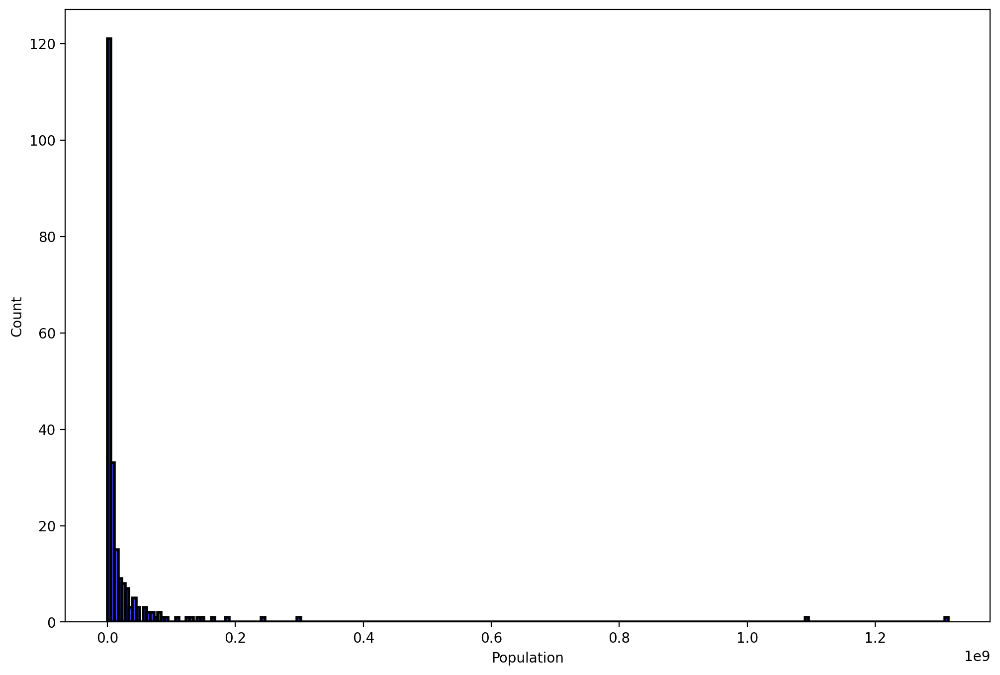

In [12]:
plt.figure(figsize=(12, 8), dpi=200)
sns.histplot(data=df, x='Population', color='blue', edgecolor='black', linewidth=2)
plt.show()

**Заметно, что гистограмма очень перекошена из-за нескольких очень больших стран. Поменяем график таким образом, чтобы показывать только страны с населением меньше 0.5 миллиарда людей.**

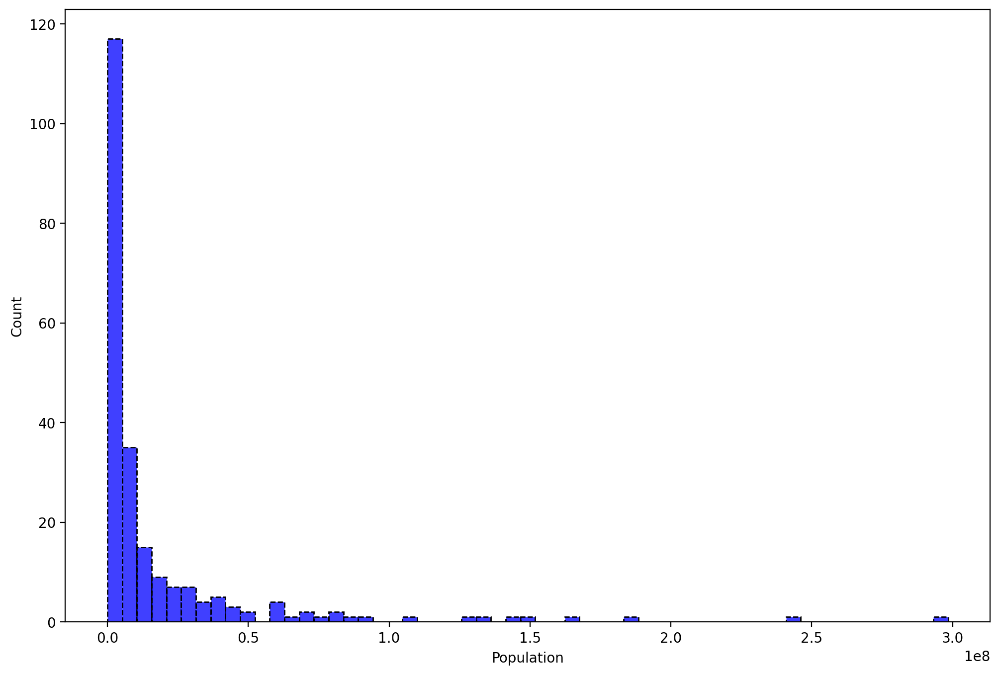

In [16]:
plt.figure(figsize=(12, 8), dpi=200)
sns.histplot(data = df[df['Population']<500_000_000], x='Population', color='blue', edgecolor='black', lw=1, ls='--')
plt.show()

**Далее исследуем GDP (ВВП - Валовый Внутренний Продукт) и регионы (Regions). Построим график barchart, на котором изобразим среднее ВВП на душу населения (GDP per Capita) для каждого региона.**

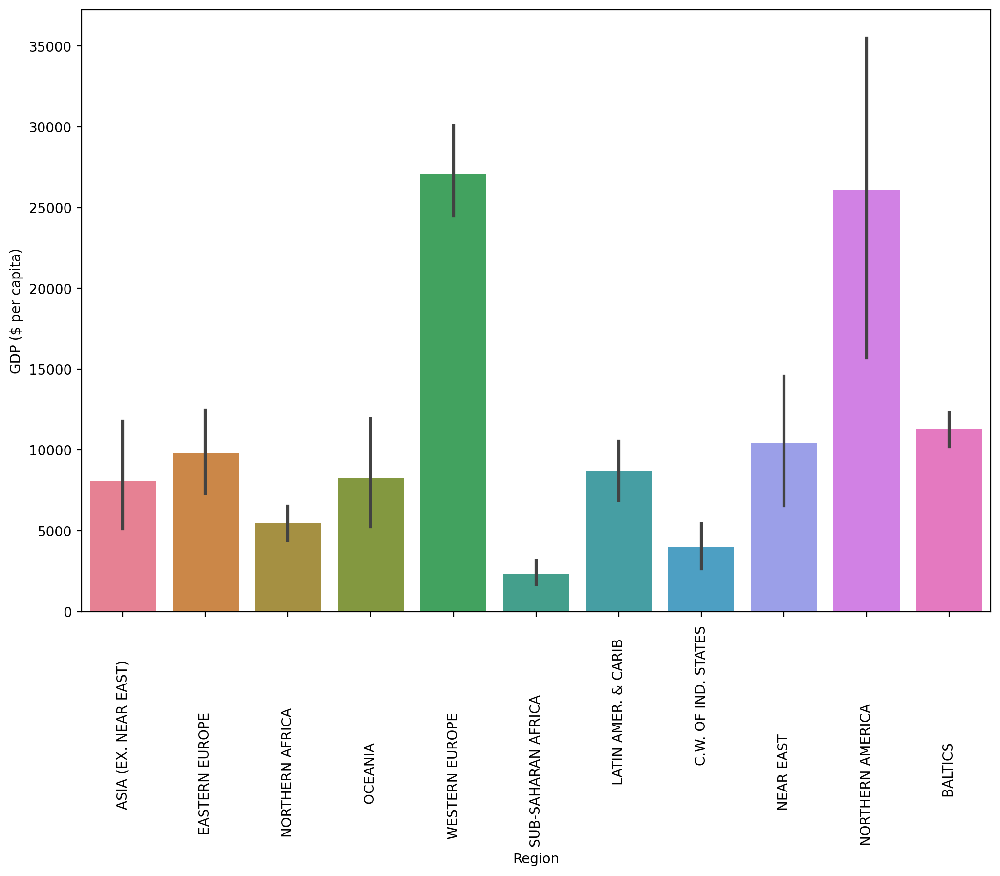

In [20]:
plt.figure(figsize=(12, 8), dpi=200)
sns.barplot(data=df, x='Region', y='GDP ($ per capita)', hue='Region')
plt.xticks(rotation=90)
plt.show()

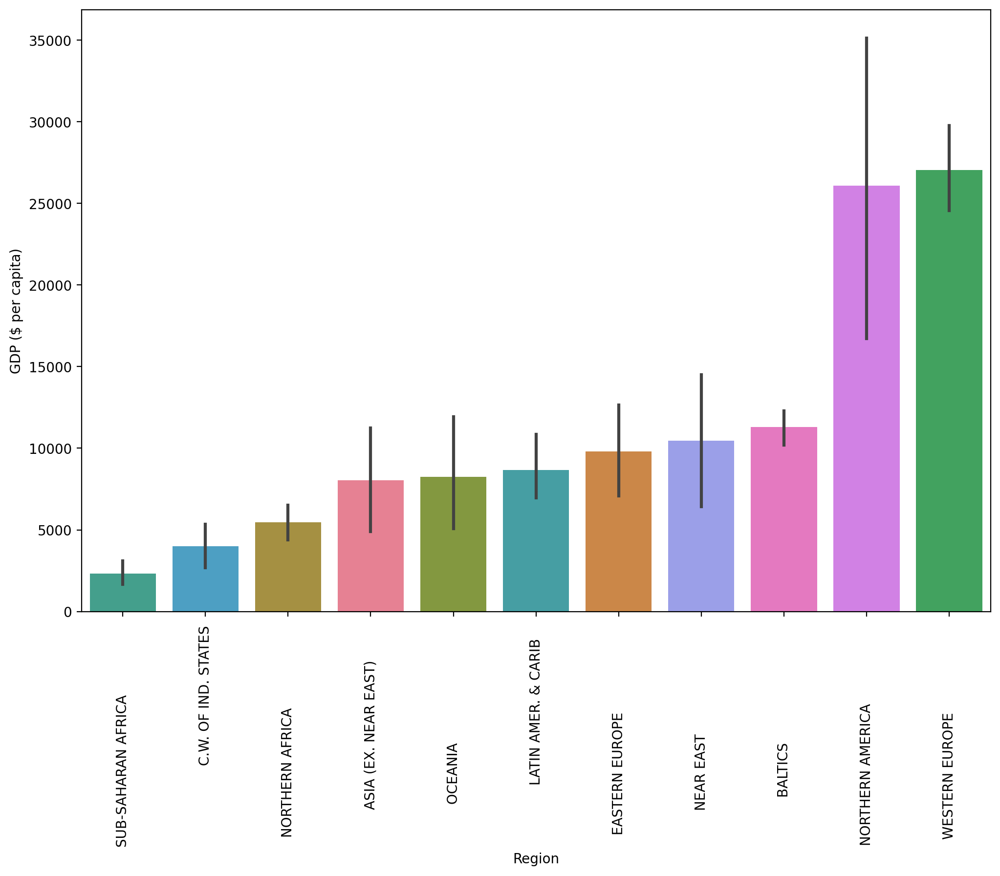

In [28]:
plt.figure(figsize=(12, 8), dpi=200)
sns.barplot(data=df, x='Region', y='GDP ($ per capita)', hue='Region', 
            order=df.groupby('Region')['GDP ($ per capita)'].mean().sort_values().index)
plt.xticks(rotation=90)
plt.show()

**Построим график scatterplot для визуализации связи между колонками "кол-во телефонов на одну тысячу человек" и "ВВП на душу населения". Раскрасим этот график разными цветами по колонке Region.**

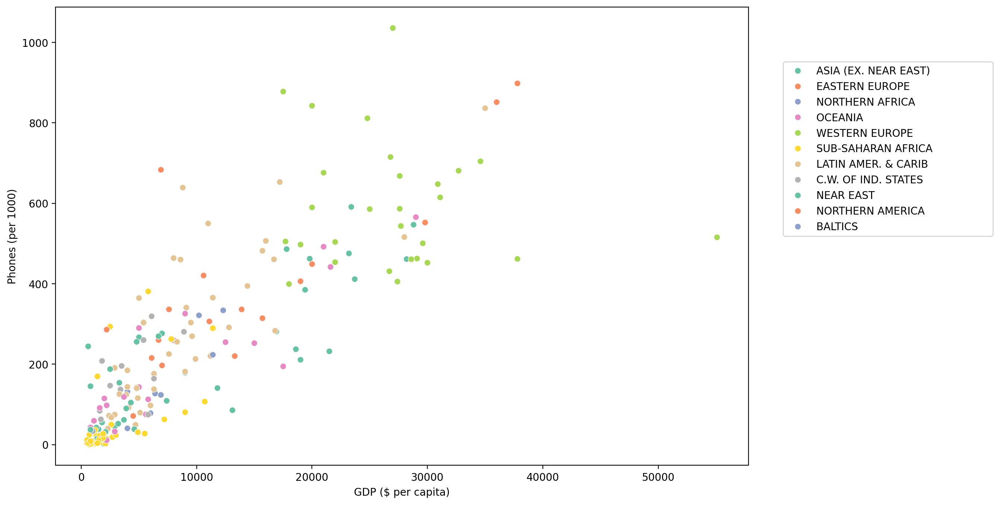

In [32]:
plt.figure(figsize=(12, 8), dpi=200)
sns.scatterplot(data=df, x='GDP ($ per capita)', y='Phones (per 1000)', hue='Region', palette='Set2')
plt.legend(loc=[1.05, 0.5])
plt.show()

In [ ]:
df[df['Phones (per 1000)']>900]

In [218]:
df[df['GDP ($ per capita)']>50000]

,Country,Region,Population,Area (sq. mi.),Pop. Density (per sq. mi.),Coastline (coast/area ratio),Net migration,Infant mortality (per 1000 births),GDP ($ per capita),Literacy (%),...,Other (%),Climate,Birthrate,Deathrate,Agriculture,Industry,Service,ISO Code,Cluster,Cluster_3
121,Luxembourg,WESTERN EUROPE,474413,2586,183.5,0.0,8.97,4.81,55100.0,100.0,...,76.32,2.826087,11.94,8.41,0.01,0.13,0.86,LUX,3,0


**Построим график scatterplot для колонок "GDP per Capita" и "Literacy" (раскрасим график по колонке Region).**

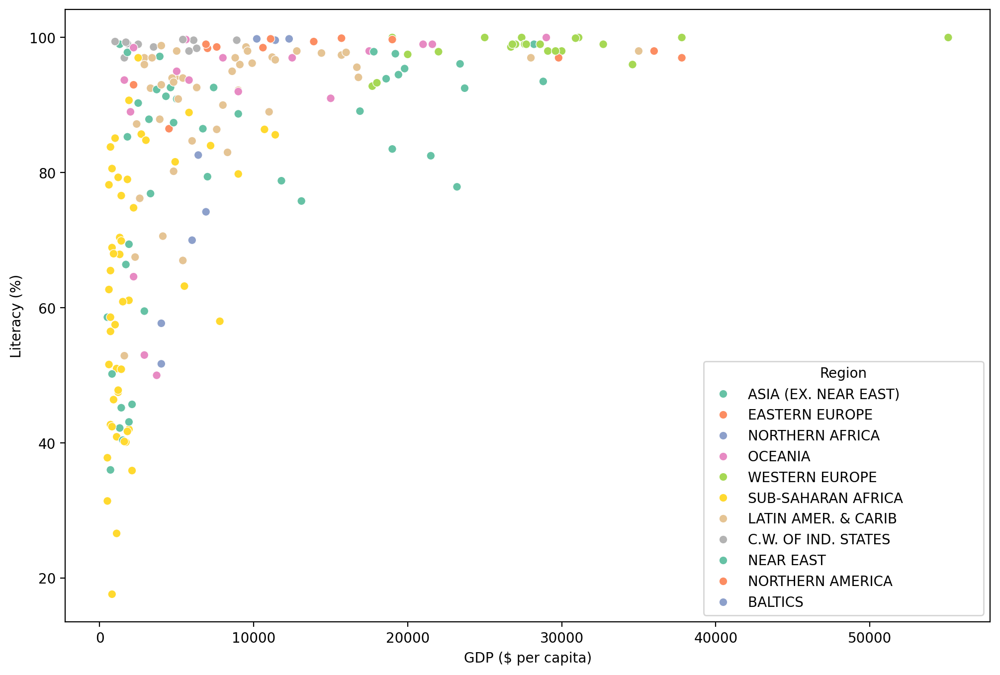

In [34]:
plt.figure(figsize=(12, 8), dpi=200)
sns.scatterplot(data=df, x='GDP ($ per capita)', y='Literacy (%)', hue='Region', palette='Set2')
plt.show()

**Построим тепловую карту Heatmap для корреляций между колонками в датафрейме.**

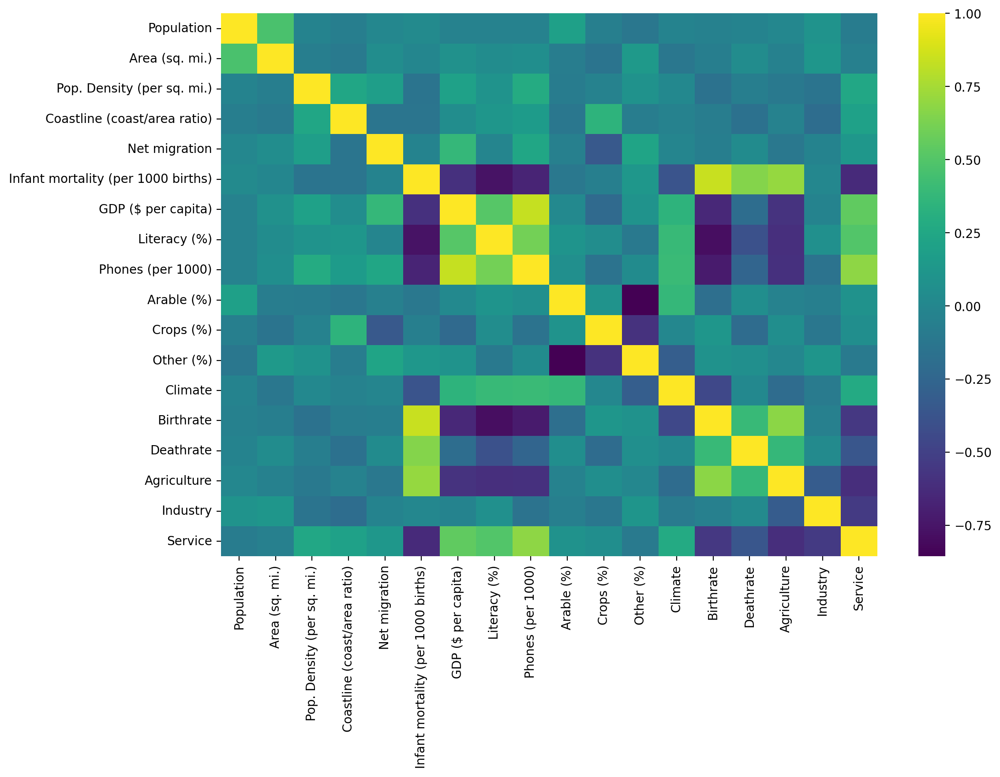

In [38]:
plt.figure(figsize=(12, 8), dpi=200)
sns.heatmap(df.corr(numeric_only=True), cmap='viridis')
plt.show()

**Seaborn может автоматически выполнять иерархическую кластеризацию данных с помощью функции clustermap(). Построим график clustermap для корреляций между колонками датафрейма.**

<Figure size 2400x1600 with 0 Axes>

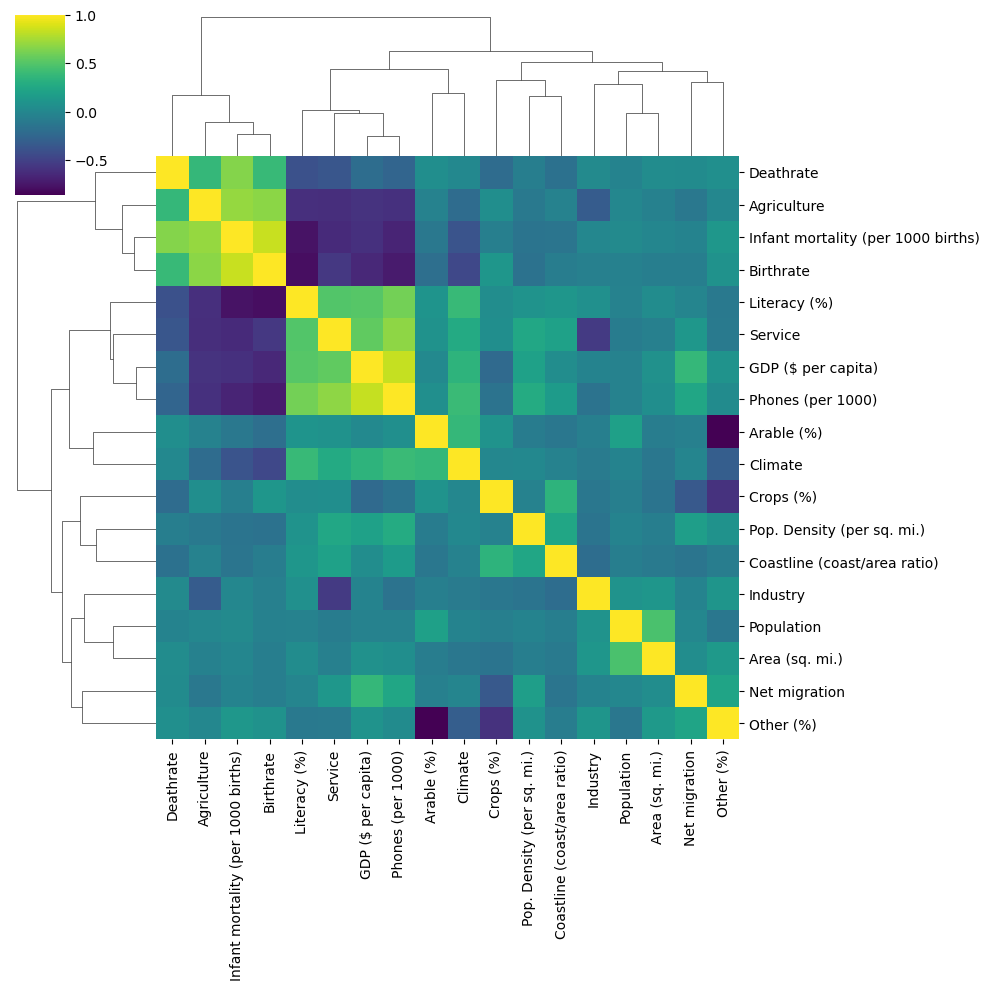

In [40]:
plt.figure(figsize=(12, 8), dpi=200)
sns.clustermap(df.corr(numeric_only=True), cmap='viridis')
plt.show()

-----

## Подготовка данных и модель данных

Подготовим данные для кластеризации с помощью метода К-средних.

### Отсутствующие данные (Missing Data)

**Построим отчёт - сколько строк имеют отсутствующие значения в той или иной колонке.**

In [42]:
df.isnull().sum()

Country                                0
Region                                 0
Population                             0
Area (sq. mi.)                         0
Pop. Density (per sq. mi.)             0
Coastline (coast/area ratio)           0
Net migration                          3
Infant mortality (per 1000 births)     3
GDP ($ per capita)                     1
Literacy (%)                          18
Phones (per 1000)                      4
Arable (%)                             2
Crops (%)                              2
Other (%)                              2
Climate                               22
Birthrate                              3
Deathrate                              4
Agriculture                           15
Industry                              16
Service                               15
dtype: int64

**Для каких стран в колонке Agriculture значения NaN?**

In [54]:
df[df['Agriculture'].isnull()]['Country']

3            American Samoa
4                   Andorra
78                Gibraltar
80                Greenland
83                     Guam
134                 Mayotte
140              Montserrat
144                   Nauru
153      N. Mariana Islands
171            Saint Helena
174    St Pierre & Miquelon
177              San Marino
208       Turks & Caicos Is
221       Wallis and Futuna
223          Western Sahara
Name: Country, dtype: object

**Заметно, что большинство этих стран являются маленькими островами, кроме Гринландии и Западной Сахары. Заменим для этих стран отсутствующие значения нулями (во всех колонках), потому что это очень маленькие страны. Мы можем применять вот такой синтаксис:**

    df[df['feature'].isnull()]
    

In [78]:
df[df['Agriculture'].isnull()] = df[df['Agriculture'].isnull()].fillna(0)

**Проверим заново, в каких колонках сколько строк имеют неопределённые значения:**

In [80]:
df.isnull().sum()

Country                                0
Region                                 0
Population                             0
Area (sq. mi.)                         0
Pop. Density (per sq. mi.)             0
Coastline (coast/area ratio)           0
Net migration                          1
Infant mortality (per 1000 births)     1
GDP ($ per capita)                     0
Literacy (%)                          13
Phones (per 1000)                      2
Arable (%)                             1
Crops (%)                              1
Other (%)                              1
Climate                               18
Birthrate                              1
Deathrate                              2
Agriculture                            0
Industry                               1
Service                                1
dtype: int64

**Колонка "climate" пустая для нескольких стран. Но для всех стран заполнена колонка Region! Пользуясь этим, заменим отсутствующие значения колонки Climate на средние значения этой колонки, где усреднение выполняется для соответствующего региона.**

Как это можно сделать: https://stackoverflow.com/questions/19966018/pandas-filling-missing-values-by-mean-in-each-group


In [82]:
df['Climate'] = df['Climate'].fillna(df.groupby('Region')['Climate'].transform('mean'))

**Проверим заново, сколько теперь отсутствующих значений.**

In [84]:
df.isnull().sum()

Country                                0
Region                                 0
Population                             0
Area (sq. mi.)                         0
Pop. Density (per sq. mi.)             0
Coastline (coast/area ratio)           0
Net migration                          1
Infant mortality (per 1000 births)     1
GDP ($ per capita)                     0
Literacy (%)                          13
Phones (per 1000)                      2
Arable (%)                             1
Crops (%)                              1
Other (%)                              1
Climate                                0
Birthrate                              1
Deathrate                              2
Agriculture                            0
Industry                               1
Service                                1
dtype: int64

**Для колонки "Literacy percentage" применим такой же метод, что и ранее для колонки Climate. Заменим отсутствующие значения колонки Literacy % на средние значения этой колонки для соответствующего региона.**

In [90]:
df['Literacy (%)'] = df['Literacy (%)'].fillna(df.groupby('Region')['Literacy (%)'].transform('mean'))

**Проверим заново, сколько теперь отсутствующих значений.**

In [92]:
df.isnull().sum()

Country                               0
Region                                0
Population                            0
Area (sq. mi.)                        0
Pop. Density (per sq. mi.)            0
Coastline (coast/area ratio)          0
Net migration                         1
Infant mortality (per 1000 births)    1
GDP ($ per capita)                    0
Literacy (%)                          0
Phones (per 1000)                     2
Arable (%)                            1
Crops (%)                             1
Other (%)                             1
Climate                               0
Birthrate                             1
Deathrate                             2
Agriculture                           0
Industry                              1
Service                               1
dtype: int64

**Теперь данные отсутствуют только для нескольких стран. Можно либо удалите такие страны, либо обработать эти отсутствующие значения по какой-либо методологии. Мы удалим эти страны.**

In [94]:
df = df.dropna()

## Подготовка данных с признаками

**Пришло время подготовить данные для кластеризации. Колонка Country является уникальным идентификатором, поэтому эта колонка не будет полезной для кластеризации, поскольку она содержит уникальные значения для каждой строки. При создании датафрейма с наборами признаков X удалим эту колонку Country.**

In [110]:
X = df.drop('Country', axis=1)

**Создадим набор признаков X, причём колонка Region всё ещё является категориальной, поэтому для этой колонки создадим дамми-переменные с помощью Pandas.**

In [112]:
X = pd.get_dummies(X, dtype=int)

In [114]:
X.head()

,Population,Area (sq. mi.),Pop. Density (per sq. mi.),Coastline (coast/area ratio),Net migration,Infant mortality (per 1000 births),GDP ($ per capita),Literacy (%),Phones (per 1000),Arable (%),...,Region_BALTICS,Region_C.W. OF IND. STATES,Region_EASTERN EUROPE,Region_LATIN AMER. & CARIB,Region_NEAR EAST,Region_NORTHERN AFRICA,Region_NORTHERN AMERICA,Region_OCEANIA,Region_SUB-SAHARAN AFRICA,Region_WESTERN EUROPE
0,31056997,647500,48.0,0.00,23.06,163.07,700.0,36.0,3.2,12.13,...,0,0,0,0,0,0,0,0,0,0
1,3581655,28748,124.6,1.26,-4.93,21.52,4500.0,86.5,71.2,21.09,...,0,0,1,0,0,0,0,0,0,0
2,32930091,2381740,13.8,0.04,-0.39,31.00,6000.0,70.0,78.1,3.22,...,0,0,0,0,0,1,0,0,0,0
3,57794,199,290.4,58.29,-20.71,9.27,8000.0,97.0,259.5,10.00,...,0,0,0,0,0,0,0,1,0,0
4,71201,468,152.1,0.00,6.60,4.05,19000.0,100.0,497.2,2.22,...,0,0,0,0,0,0,0,0,0,1


### Масштабирование данных

**Поскольку некоторые колонки измеряются в процентах, а некоторые в абсолютных значениях, то выполним масштабирование признаков с помощью Sklearn.**

In [116]:
from sklearn.preprocessing import StandardScaler

In [118]:
scaler = StandardScaler()

In [120]:
scaled_X = scaler.fit_transform(X)

In [122]:
scaled_X

array([[ 0.0133285 ,  0.01855412, -0.20308668, ..., -0.31544015,
        -0.54772256, -0.36514837],
       [-0.21730118, -0.32370888, -0.14378531, ..., -0.31544015,
        -0.54772256, -0.36514837],
       [ 0.02905136,  0.97784988, -0.22956327, ..., -0.31544015,
        -0.54772256, -0.36514837],
       ...,
       [-0.06726127, -0.04756396, -0.20881553, ..., -0.31544015,
        -0.54772256, -0.36514837],
       [-0.15081724,  0.07669798, -0.22840201, ..., -0.31544015,
         1.82574186, -0.36514837],
       [-0.14464933, -0.12356132, -0.2160153 , ..., -0.31544015,
         1.82574186, -0.36514837]])

### Создание и обучение модели Kmeans




**Напишем цикл for для создания и обучения нескольких моделей KMeans, проверяя количество кластеров K от 2 до 30. На каждом шаге цикла будем сохранять сумму квадратов расстояний от точек до центров кластеров (SSD - Sum of Squared Distances) для каждого значения K. Далее нанесём эти данные на график, изображая метрику SSD для различных значений К. Также построим график barplot с изменениями метрики SSD.**

In [124]:
from sklearn.cluster import KMeans

In [126]:
ssd = []

for k in range(2, 31):
    model = KMeans(n_clusters=k)
    model.fit(scaled_X)

    ssd.append(model.inertia_)

C:\Users\chern\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\chern\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\chern\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\chern\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

In [128]:
ssd

[6091.949053650443,
 5212.875954245856,
 4687.073191706874,
 4378.504099568015,
 4132.439141443252,
 3816.5013541622166,
 3640.3008244259513,
 3527.559219848274,
 3152.1936638968496,
 3070.888709839757,
 2873.824821043655,
 2514.189294616875,
 2561.8110033344046,
 2272.9766024714395,
 2266.780766652216,
 2203.724813044054,
 2054.7662754702874,
 1928.8985942838776,
 1914.0522220656133,
 1766.2445975756898,
 1651.1070291264828,
 1742.1218768401532,
 1604.8130784011753,
 1538.0400405857008,
 1468.2524600584497,
 1432.2496945874125,
 1401.608441090891,
 1440.2906146937207,
 1341.8255429901226]

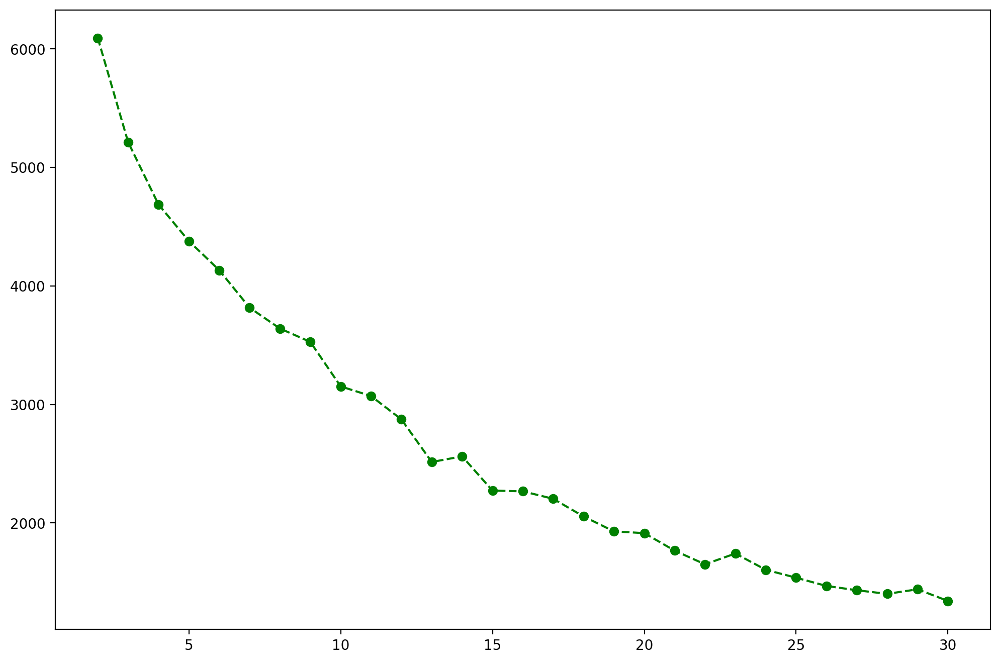

In [142]:
plt.figure(figsize=(12, 8), dpi=200)
plt.plot(range(2, 31), ssd, 'go--')
plt.show()

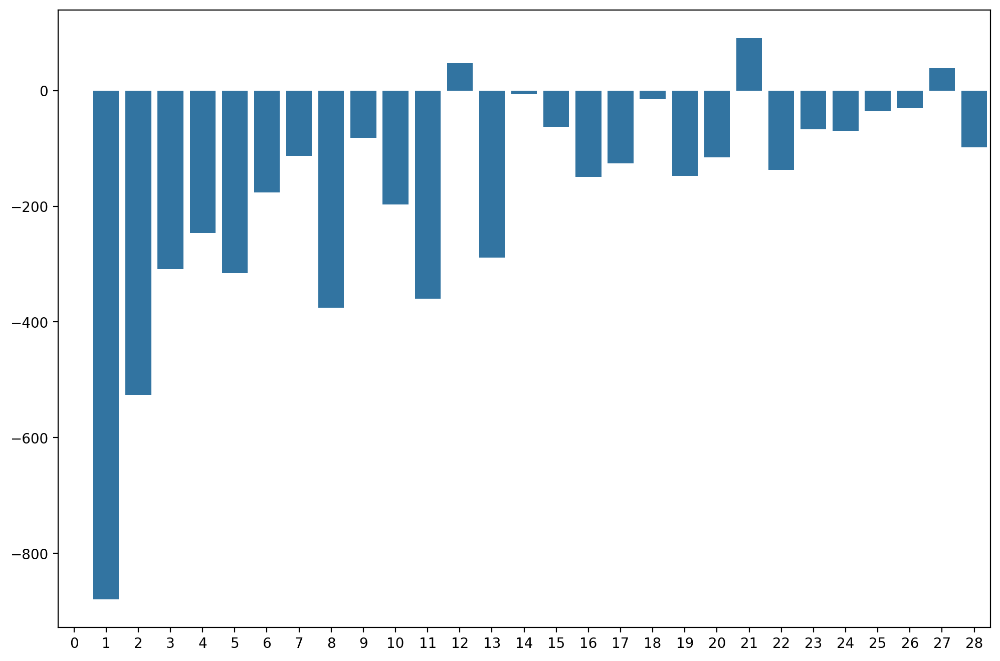

In [146]:
plt.figure(figsize=(12, 8), dpi=200)
sns.barplot(pd.Series(ssd).diff())
plt.show()

-----

# Интерпретация модели


**Какое значение K может быть хорошим выбором? Возможно таких значений несколько? Какие признаки влияют на формирование этих кластеров? Поскольку это обучение без учителя (unsupervised learning), здесь нет на 100% правильного ответа.**

-----


#### Пример: выбираем K=3

**Можно сказать, что в точке K=3 падение метрики SSD более пологое (хотя метрика продолжает уменьшаться после этой точки). Как может выглядеть картина для K=3? Посмотрим, какие признаки являются важными в случае 3 кластеров!**

In [166]:
final_model = KMeans(n_clusters=3)

In [168]:
cluster_labels = final_model.fit(scaled_X)

C:\Users\chern\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [170]:
cluster_labels

KMeans(n_clusters=3)

In [172]:
cluster_labels.labels_

array([2, 0, 1, 1, 0, 2, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 2, 0, 0, 0, 1, 2,
       0, 2, 1, 0, 2, 1, 0, 1, 0, 2, 2, 2, 2, 2, 0, 1, 0, 2, 2, 1, 1, 1,
       2, 2, 2, 1, 2, 0, 1, 0, 0, 2, 1, 1, 1, 1, 1, 2, 2, 0, 2, 0, 1, 0,
       0, 1, 1, 2, 2, 1, 1, 0, 2, 1, 0, 1, 1, 1, 1, 1, 2, 2, 1, 2, 1, 0,
       0, 0, 2, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 2, 1, 1, 0, 1, 1, 2,
       0, 1, 2, 2, 1, 0, 0, 0, 1, 0, 2, 2, 1, 1, 2, 0, 1, 1, 2, 0, 2, 1,
       1, 0, 1, 1, 1, 2, 2, 1, 2, 0, 1, 1, 0, 1, 2, 2, 1, 0, 1, 2, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 2, 1, 1, 1, 1, 1, 1, 0, 2, 1, 2,
       1, 2, 1, 0, 0, 1, 2, 2, 0, 1, 2, 1, 2, 0, 0, 1, 0, 2, 2, 1, 2, 1,
       1, 1, 1, 1, 1, 1, 2, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2,
       2], dtype=int32)

In [174]:
X['Cluster'] = cluster_labels.labels_

In [176]:
X.corr()['Cluster'].sort_values()

Phones (per 1000)                            -0.728801
GDP ($ per capita)                           -0.675407
Literacy (%)                                 -0.611845
Climate                                      -0.499396
Region_WESTERN EUROPE                        -0.484444
Service                                      -0.393643
Region_EASTERN EUROPE                        -0.315844
Arable (%)                                   -0.251967
Region_BALTICS                               -0.161889
Region_C.W. OF IND. STATES                   -0.136905
Net migration                                -0.126498
Region_NORTHERN AMERICA                      -0.125596
Pop. Density (per sq. mi.)                   -0.058245
Coastline (coast/area ratio)                 -0.053541
Area (sq. mi.)                               -0.051174
Region_LATIN AMER. & CARIB                   -0.027983
Region_NEAR EAST                             -0.023246
Region_OCEANIA                               -0.019886
Region_NOR

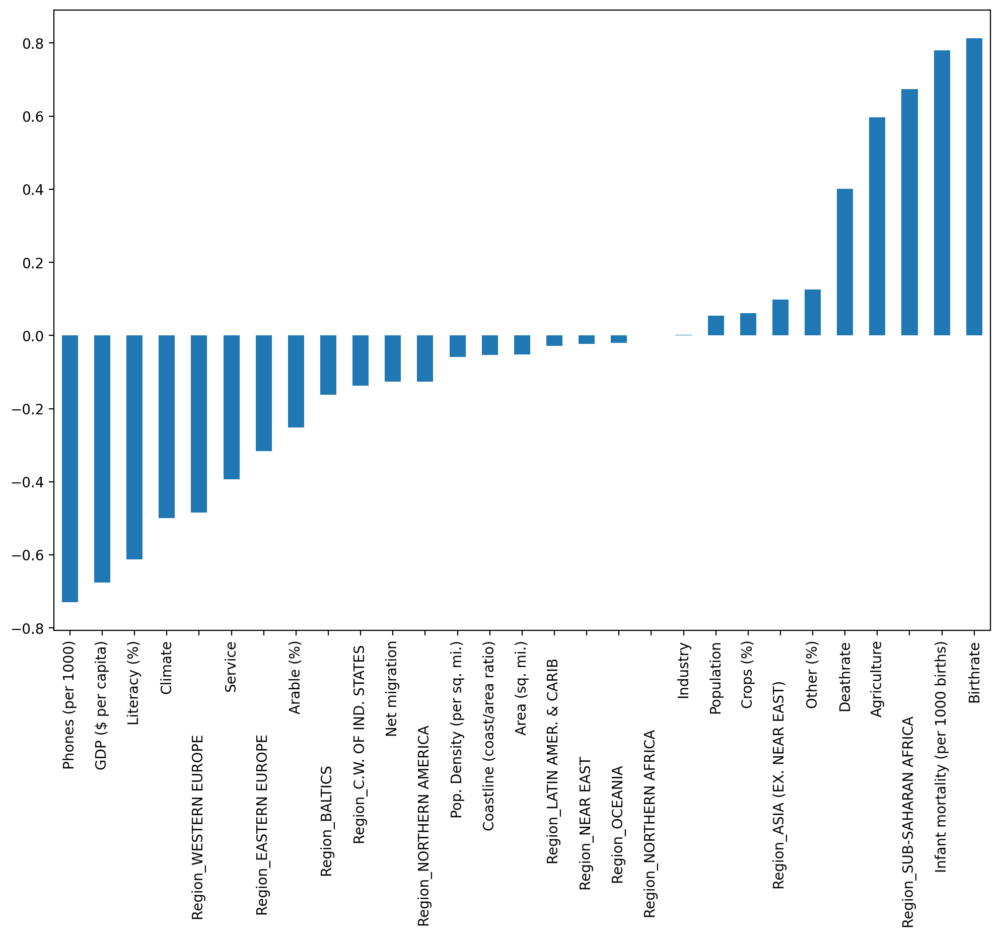

In [178]:
plt.figure(figsize=(12, 8), dpi=200)
X.corr()['Cluster'].iloc[:-1].sort_values().plot(kind='bar')
plt.show()

------------
-------------

## Географическая интерпретация модели

Результаты этой модели можно очень удобно визуализировать на географической карте!

----
----

**Создадим кластеры для выбранного значения K. В нашем варианте решений мы думаем, что варианты K=3 или K=15 являются разумными вариантами. Но можно попробовать и другие варианты для количества кластеров.**

In [202]:
model_15 = KMeans(n_clusters=15)
model_15.fit(scaled_X)

C:\Users\chern\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



KMeans(n_clusters=15)

In [204]:
model_3 = KMeans(n_clusters=3)
model_3.fit(scaled_X)

C:\Users\chern\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



KMeans(n_clusters=3)

**Нанесём страны и кластеры на географическую карту:**

1. Необходимо установить библиотеку plotly: https://plotly.com/python/getting-started/

2. Создадим географическую карту choropleth map с помощью plotly: https://plotly.com/python/choropleth-maps/#using-builtin-country-and-state-geometries

3. Нам понадобятся ISO-коды. Их можно взять из Википедии, или использовать файл `country_iso_codes.csv`, который прикреплён в данном репозитории.**

4. С помощью номеров кластеров для стран, кодов ISO и названий стран построим карту мира с помощью plotly.



In [186]:
iso_codes = pd.read_csv('../DATA/country_iso_codes.csv')

In [188]:
iso_codes

,Country,ISO Code
0,Afghanistan,AFG
1,"Akrotiri and Dhekelia – See United Kingdom, The","Akrotiri and Dhekelia – See United Kingdom, The"
2,Åland Islands,ALA
3,Albania,ALB
4,Algeria,DZA
...,...,...
296,"Congo, Dem. Rep.",COD
297,"Congo, Repub. of the",COG
298,Tanzania,TZA
299,Central African Rep.,CAF


В исходном датафрейме имеется колонка Country, нам нужно добавить новую колонку, в которой, на основе названия страны, будет записан её ISO код.

Для этого сначала создадим словарь соответствия между названием стран и их ISO кодами. После чего, в исходном датафрейме создадим колонку, которая будет содержать ISO коды для какждой страны. Если для какой-то из стран ISO коды не нашлись, то вместо них будут значения NaN.

In [190]:
iso_mapping = iso_codes.set_index('Country')['ISO Code'].to_dict()

In [192]:
iso_mapping

{'Afghanistan': 'AFG',
 'Akrotiri and Dhekelia – See United Kingdom, The': 'Akrotiri and Dhekelia – See United Kingdom, The',
 'Åland Islands': 'ALA',
 'Albania': 'ALB',
 'Algeria': 'DZA',
 'American Samoa': 'ASM',
 'Andorra': 'AND',
 'Angola': 'AGO',
 'Anguilla': 'AIA',
 'Antarctica\u200a[a]': 'ATA',
 'Antigua and Barbuda': 'ATG',
 'Argentina': 'ARG',
 'Armenia': 'ARM',
 'Aruba': 'ABW',
 'Ashmore and Cartier Islands – See Australia.': 'Ashmore and Cartier Islands – See Australia.',
 'Australia\u200a[b]': 'AUS',
 'Austria': 'AUT',
 'Azerbaijan': 'AZE',
 'Bahamas (the)': 'BHS',
 'Bahrain': 'BHR',
 'Bangladesh': 'BGD',
 'Barbados': 'BRB',
 'Belarus': 'BLR',
 'Belgium': 'BEL',
 'Belize': 'BLZ',
 'Benin': 'BEN',
 'Bermuda': 'BMU',
 'Bhutan': 'BTN',
 'Bolivia (Plurinational State of)': 'BOL',
 'Bonaire\xa0Sint Eustatius\xa0Saba': 'BES',
 'Bosnia and Herzegovina': 'BIH',
 'Botswana': 'BWA',
 'Bouvet Island': 'BVT',
 'Brazil': 'BRA',
 'British Indian Ocean Territory (the)': 'IOT',
 'British V

In [196]:
df['ISO Code'] = df['Country'].map(iso_mapping)

Добавим колонку с номерами кластеров

In [206]:
df['Cluster'] = model_15.labels_

In [227]:
import plotly.express as px

fig = px.choropleth(df, locations="ISO Code",
                    color="Cluster", # Раскрашивание по цветам
                    hover_name="Country", 
                    color_continuous_scale='Turbo')
fig.show()

In [212]:
df['Cluster_3'] = model_3.labels_

In [229]:
import plotly.express as px

fig = px.choropleth(df, locations="ISO Code",
                    color="Cluster_3", # lifeExp is a column of gapminder
                    hover_name="Country", # column to add to hover information
                    color_continuous_scale='Turbo')
fig.show()

---